In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('insurance_fraud.csv')

In [3]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.shape

(1000, 40)

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [7]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [8]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [9]:
df.isna().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                 False
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [10]:
df.drop('_c39',axis=1,inplace=True)

In [11]:
df.replace('?', np.nan,inplace=True)

In [12]:
df.shape

(1000, 39)

In [13]:
df.isna().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                  True
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [14]:
mode=df['collision_type'].mode()
mode

0    Rear Collision
dtype: object

In [15]:
df['collision_type'].fillna(mode,inplace=True)

In [16]:
mode=df['property_damage'].mode()
mode

0    NO
dtype: object

In [17]:
df['property_damage'].fillna(mode,inplace=True)

In [18]:
mode=df['police_report_available'].mode()
mode

0    NO
dtype: object

In [19]:
df['police_report_available'].fillna(mode,inplace=True)

In [20]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['policy_bind_date'] = le.fit_transform(df['policy_bind_date']) 
df['policy_csl'] = le.fit_transform(df['policy_csl']) 
df['insured_sex'] = le.fit_transform(df['insured_sex']) 
df['insured_relationship'] = le.fit_transform(df['insured_relationship']) 
df['insured_hobbies'] = le.fit_transform(df['insured_hobbies']) 
df['incident_type'] = le.fit_transform(df['incident_type']) 
df['collision_type'] = le.fit_transform(df['collision_type'].astype('str')) 
df['incident_severity'] = le.fit_transform(df['incident_severity']) 
df['authorities_contacted'] = le.fit_transform(df['authorities_contacted']) 
df['incident_state'] = le.fit_transform(df['incident_state']) 
df['incident_city'] = le.fit_transform(df['incident_city']) 
df['incident_location'] = le.fit_transform(df['incident_location']) 
df['property_damage'] = le.fit_transform(df['property_damage'].astype('str')) 
df['police_report_available'] = le.fit_transform(df['police_report_available'].astype('str')) 
df['auto_make'] = le.fit_transform(df['auto_make']) 
df['auto_model'] = le.fit_transform(df['auto_model']) 
df['fraud_reported'] = le.fit_transform(df['fraud_reported'])

In [21]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                 int32
policy_state                    object
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_education_level         object
insured_occupation              object
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_location                int32
incident_hour_of_the_day 

In [22]:
df.drop('policy_state',axis=1,inplace=True)

In [23]:
df.drop('insured_education_level',axis=1,inplace=True)

In [24]:
df.drop('insured_occupation',axis=1,inplace=True)

In [27]:
df.drop('incident_date',axis=1,inplace=True)

In [28]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                 int32
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_location                int32
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                

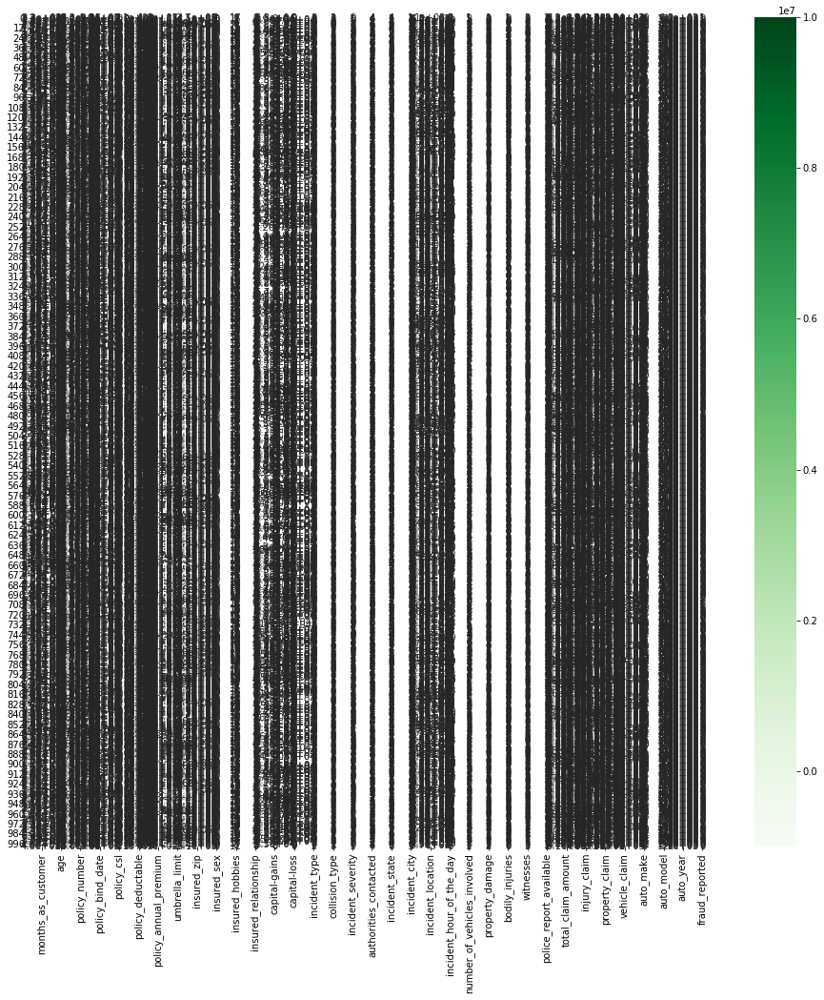

In [30]:
plt.figure(figsize = (16,16))
sns.heatmap(df, cmap='Greens',annot=True,linewidths=0.5)

In [31]:
cordf=df.corr()
cordf

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,...,0.058383,-0.071746,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544
age,0.922098,1.000000,0.059413,0.056538,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,...,0.052359,-0.063040,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.038917,-0.006738,0.022566,0.008968,0.007083,0.004564,...,-0.012661,-0.010198,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.008486,-0.001721,-0.037733,-0.024866,-0.042749,0.039338,...,-0.007004,0.048866,0.015901,0.024160,0.008611,0.013784,-0.025955,0.000306,0.035067,0.060642
policy_csl,-0.026819,-0.015185,0.038917,0.008486,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,...,0.071500,-0.007507,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.026807,0.029188,-0.006738,-0.001721,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,...,0.066639,0.004936,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,-0.037733,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,...,0.002332,0.010332,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,0.008968,-0.024866,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,...,-0.006738,0.034177,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.007083,-0.042749,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,...,0.019805,0.050983,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368
insured_sex,0.060925,0.073337,0.004564,0.039338,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,...,0.042463,-0.029056,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873


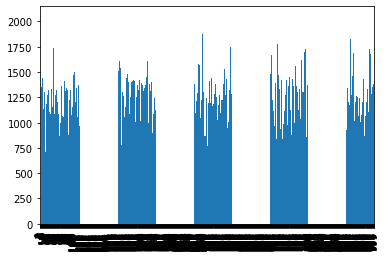

In [33]:
df['policy_annual_premium'].plot.bar()

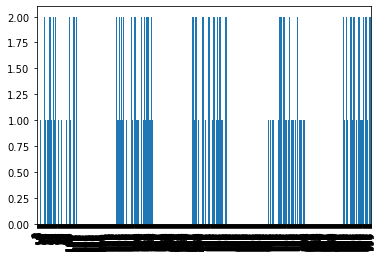

In [34]:
df['property_damage'].plot.bar()

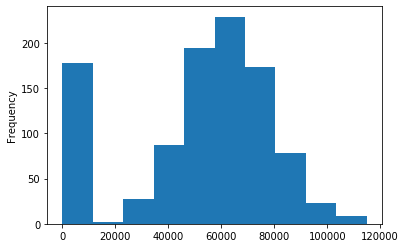

In [36]:
df['total_claim_amount'].plot.hist()

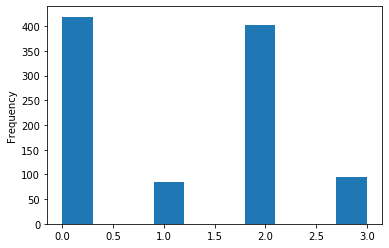

In [38]:
df['incident_type'].plot.hist()

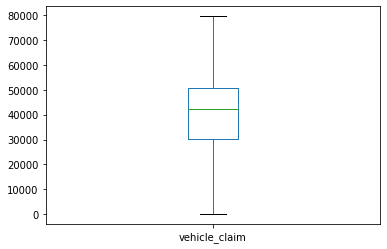

In [39]:
df['vehicle_claim'].plot.box()

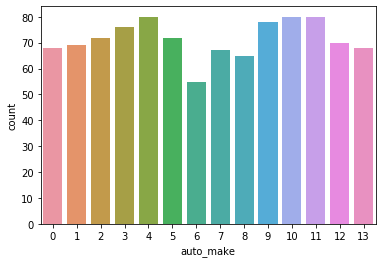

In [40]:
sns.countplot(df['auto_make'])#not much variance of incidence between auto makes

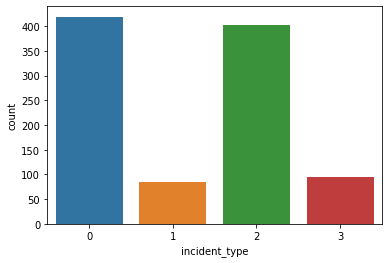

In [41]:
sns.countplot(df['incident_type'])#there are two most common incident types

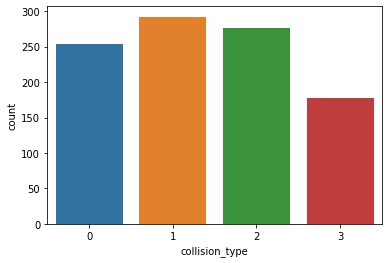

In [42]:
sns.countplot(df['collision_type'])#all the collision types are almost evenly distributed

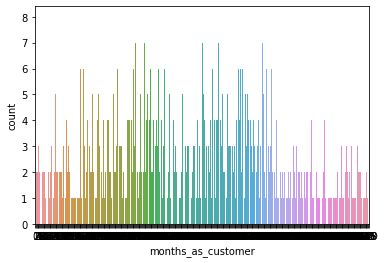

In [43]:
sns.countplot(df['months_as_customer']) 

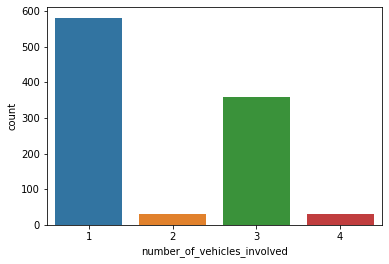

In [44]:
sns.countplot(df['number_of_vehicles_involved']) # most of the incidence involve one(1) vehicle only and the next common involves three(3) velhicles

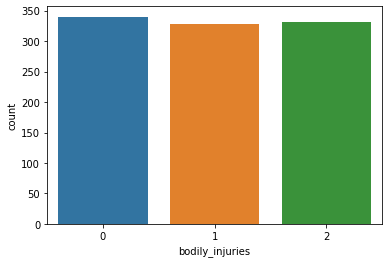

In [48]:
sns.countplot(df['bodily_injuries'])# there is an even spread of bodily injuries

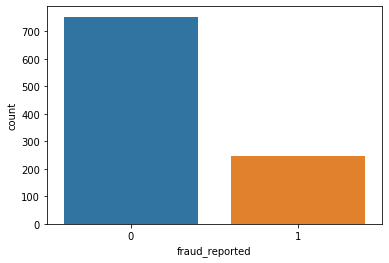

In [46]:
sns.countplot(df['fraud_reported'])#most of the fraud claims are reported

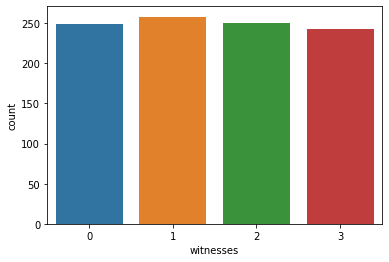

In [47]:
sns.countplot(df['witnesses'])#all the collision types are almost evenly distributed

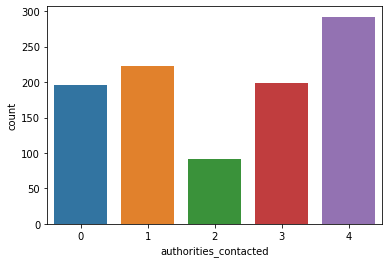

In [49]:
sns.countplot(df['authorities_contacted'])#most contacted authorities is the police

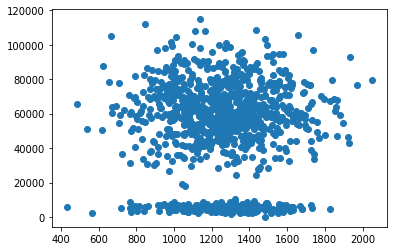

In [50]:
plt.scatter(df['policy_annual_premium'],df['total_claim_amount'])#No relationship between these variables

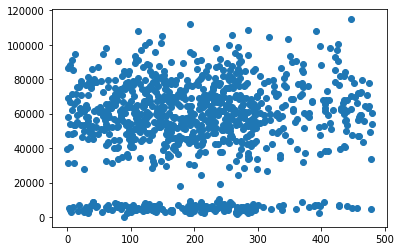

In [51]:
plt.scatter(df['months_as_customer'],df['total_claim_amount'])#No relationship between these variables

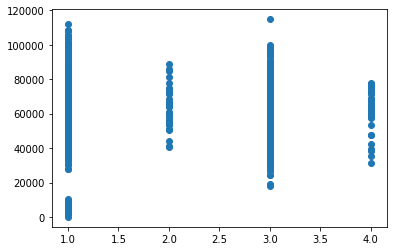

In [52]:
plt.scatter(df['number_of_vehicles_involved'],df['total_claim_amount'])

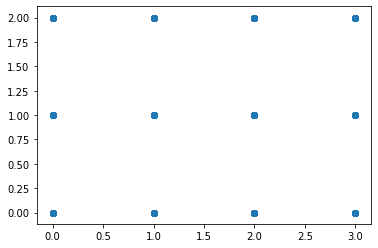

In [53]:
plt.scatter(df['collision_type'],df['bodily_injuries'])

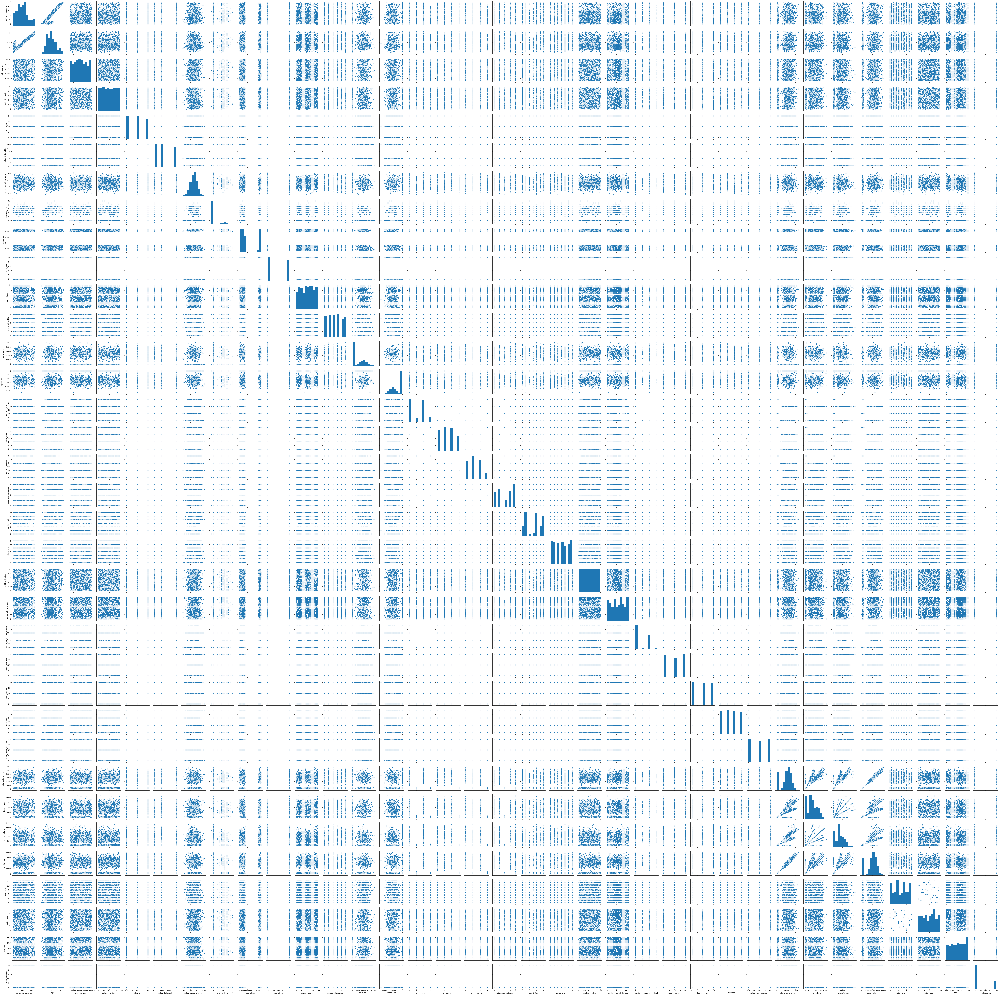

In [54]:
sns.pairplot(df)

months_as_customer                AxesSubplot(0.125,0.749828;0.0824468x0.130172)
age                            AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
policy_number                  AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
policy_bind_date               AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
policy_csl                     AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
policy_deductable              AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
policy_annual_premium          AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
umbrella_limit                 AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
insured_zip                       AxesSubplot(0.125,0.593621;0.0824468x0.130172)
insured_sex                    AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
insured_hobbies                AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
insured_relationship           AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
capital-gains               

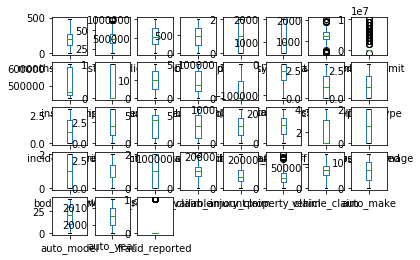

In [55]:
df.plot(kind='box',subplots=True,layout=(5,8))

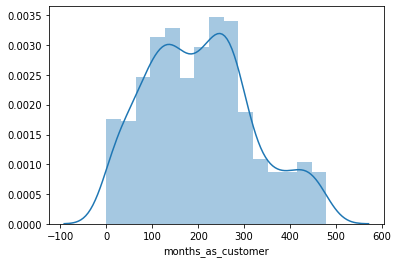

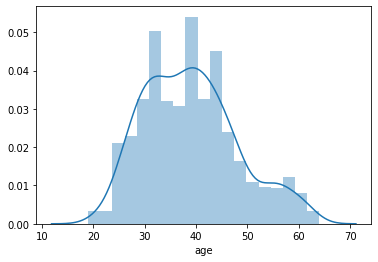

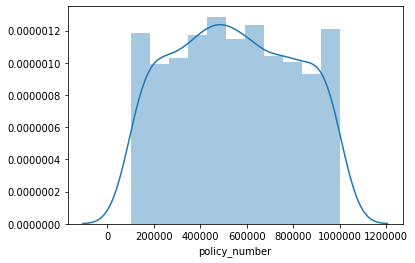

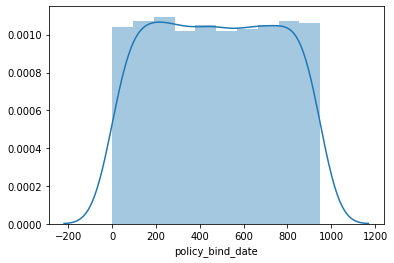

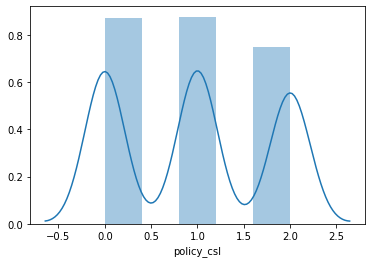

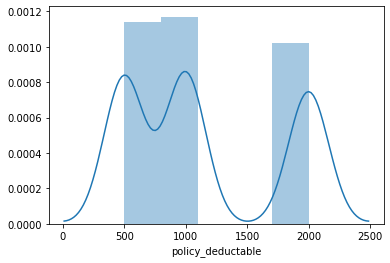

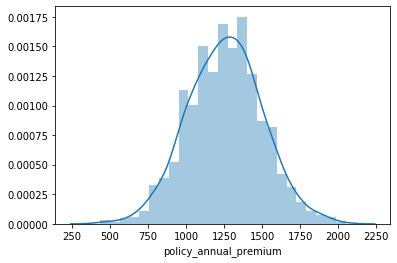

RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

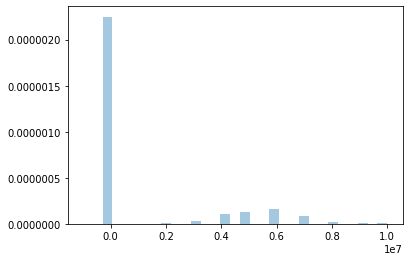

In [56]:
for i in df.describe().columns:
    sns.distplot(df[i])
    plt.show()

In [57]:
from scipy.stats import zscore
z_score=abs(zscore(df))
print(df.shape)
df1=df.loc[(z_score<3).all(axis=1)]
print(df1.shape)

(1000, 35)
(980, 35)


In [58]:
df1.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                 0.128949
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725
property_damage               -0.042133
bodily_injuries                0.003757


In [59]:
umbrella_limit_sqrt=np.sqrt(df1['umbrella_limit'])
umbrella_limit_sqrt.skew()

1.6485392368711083

In [60]:
insured_zip_sqrt=np.sqrt(df1['insured_zip'])
insured_zip_sqrt.skew()

0.8208241759612926

In [61]:
fraud_reported_sqrt=np.sqrt(df1['fraud_reported'])
fraud_reported_sqrt.skew()

1.188267044621286

In [62]:
x=df1.iloc[:,0:-1]
x.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,521585,532,1,1000,1406.91,0,466132,1,...,1,2,1,71610,6510,13020,52080,10,1,2004
1,228,42,342868,821,1,2000,1197.22,5000000,468176,1,...,0,0,2,5070,780,780,3510,8,12,2007
2,134,29,687698,186,0,2000,1413.14,5000000,430632,0,...,2,3,0,34650,7700,3850,23100,4,30,2007
3,256,41,227811,766,1,2000,1415.74,6000000,608117,0,...,1,2,0,63400,6340,6340,50720,3,34,2014
4,228,44,367455,181,2,1000,1583.91,6000000,610706,1,...,0,1,0,6500,1300,650,4550,0,31,2009


In [63]:
y=df1.iloc[:,-1]
y.head()

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int32

In [64]:
y=y.values.reshape(-1,1)

In [65]:
y.shape

(980, 1)

In [66]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df1)
x=pd.DataFrame(x,columns=df1.columns)

In [67]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=58,stratify=y)

In [68]:
x_train.shape,x_test.shape

((686, 35), (294, 35))

In [69]:
y_train.shape,y_test.shape

((686, 1), (294, 1))

In [70]:
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,auc

In [71]:
KNN=KNeighborsClassifier(n_neighbors=6)
SV=SVC()
LR=LogisticRegression()
DT=DecisionTreeClassifier(random_state=6)
GNB=GaussianNB()

In [72]:
models = []
models.append(('KNeighborsClassifier', KNN))
models.append(('SVC', SV))
models.append(('LogisticRegression', LR))
models.append(('DecisionTreeClassifier', DT))
models.append(('GaussianNB', GNB))

*********************** KNeighborsClassifier ***********************


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=6, p=2,
                     weights='uniform')


Accuracy_score=  0.891156462585034


Cross_Val_Score=  0.8948979591836735


roc_auc_score=  0.7777777777777778


classification_report
               precision    recall  f1-score   support

           0       0.87      1.00      0.93       222
           1       1.00      0.56      0.71        72

    accuracy                           0.89       294
   macro avg       0.94      0.78      0.82       294
weighted avg       0.90      0.89      0.88       294


[[222   0]
 [ 32  40]]


AxesSubplot(0.125,0.808774;0.62x0.0712264)



*********************** SVC ***********************


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
  

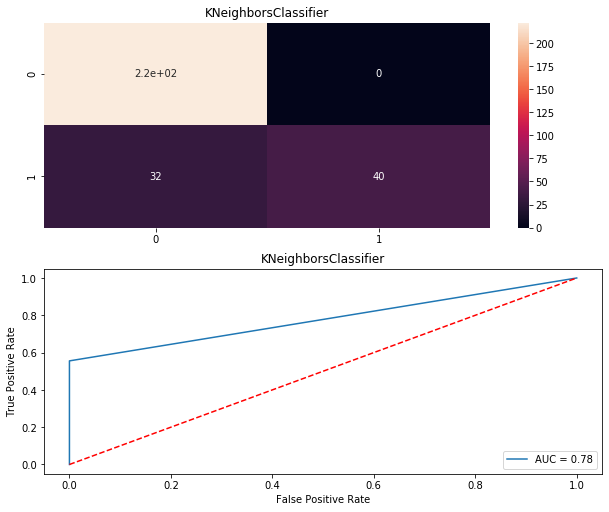

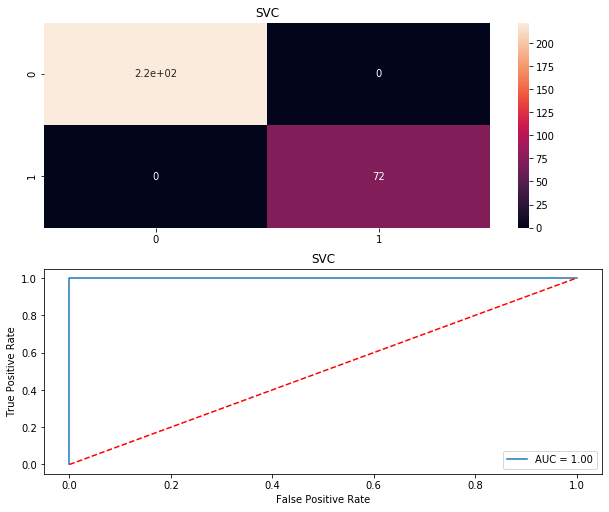

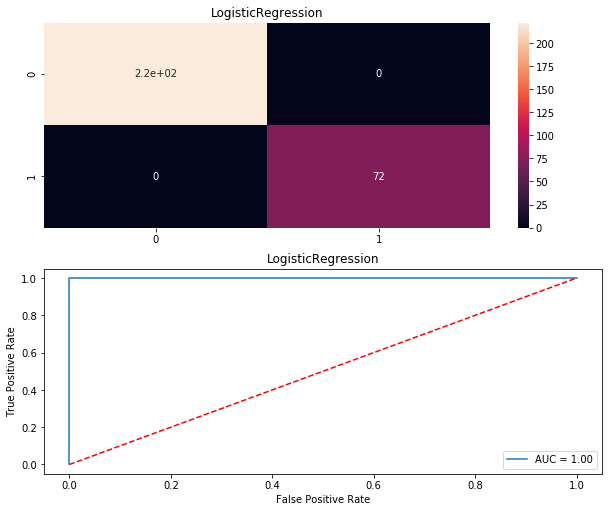

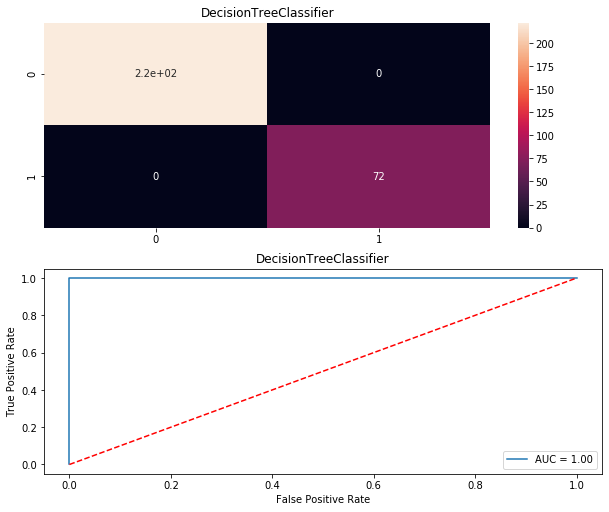

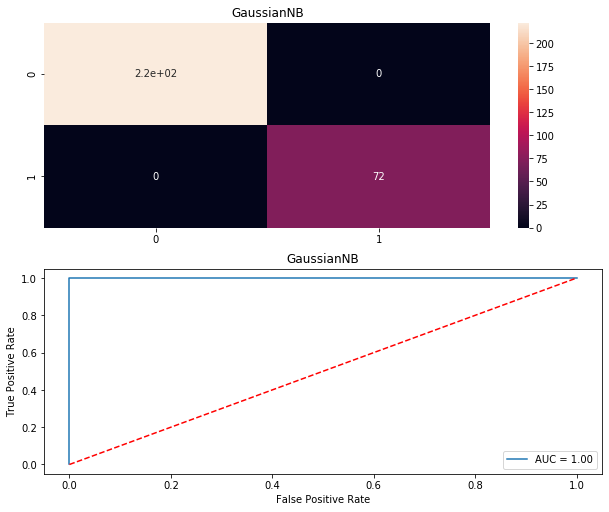

In [73]:
Model = []
score = []
cvs = []
rocscore =[]
for name,model in models:
    print('***********************',name,'***********************')
    print('\n')
    Model.append(name)
    model.fit(x_train,y_train)
    print(model)
    pre=model.predict(x_test)
    print('\n')
    AS=accuracy_score(y_test,pre)
    print('Accuracy_score= ',AS)
    score.append(AS*100)
    print('\n')
    sc = cross_val_score(model, x, y, cv=10, scoring='accuracy').mean()
    print('Cross_Val_Score= ',sc)
    cvs.append(sc*100)
    print('\n')
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,pre)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    print('roc_auc_score= ',roc_auc)
    rocscore.append(roc_auc*100)
    print('\n')
    print('classification_report\n',classification_report(y_test,pre), end = "\n\n")
    cm=confusion_matrix(y_test,pre)
    print(cm)
    print('\n')
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True))
    plt.subplot(912)
    plt.title(name)
    plt.plot(false_positive_rate,true_positive_rate, label='AUC = %0.2f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    print('\n\n')

In [74]:
result=pd.DataFrame({'Model':Model, 'Accuracy_score': score,'Cross_val_score':cvs, 'Roc_auc_curve':rocscore})
result

,Model,Accuracy_score,Cross_val_score,Roc_auc_curve
0,KNeighborsClassifier,89.115646,89.489796,77.777778
1,SVC,100.000000,100.000000,100.000000
2,LogisticRegression,100.000000,100.000000,100.000000
3,DecisionTreeClassifier,100.000000,100.000000,100.000000
4,GaussianNB,100.000000,100.000000,100.000000


In [75]:
from sklearn.externals import joblib

In [76]:
joblib.dump(DT,'insurancefraud_file.obj')

['insurancefraud_file.obj']